In [ ]:
!pip3 install geemap
!pip3 install geopandas==0.6.0

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm_notebook as tqdm
from google.colab import drive



In [2]:
drive.mount('/content/drive')
%cd drive/MyDrive/'Omdena SA mapping urban vulnerability '/Data/monthly/Full_set


Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1SIVqHfbAYQm1dtitsq48uODX8qAJkH3w/Omdena SA mapping urban vulnerability /Data/monthly/Full_set


**Yearly Data Processing**

Yearly data statistics provided have been filtered, pre-processed and categorized among different provinces i.e **Eastern Cape, Mpumalanga, Western Cape, Gauteng, KwaZulu Natal, North West, Northern Cape, Free State and Limpopo.** CSVs corroesponding to each province has been created, with each CSV containing the following data - **City, CRIME CATEGORY, April 2004 to March 2005 , April 2005 to March 2006 , April 2006 to March 2007 , April 2007 to March 2008 , April 2008 to March 2009 ,April 2009 to March 2010, April 2010 to March 2011 , April 2011 to March 2012 , April 2012 to March 2013 , April 2013 to March 2014.** 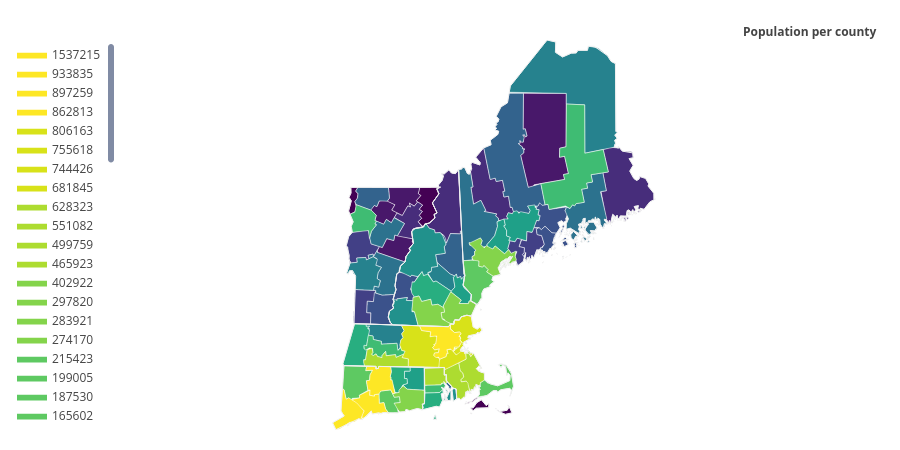


**TASK - 1** is to create a webapp using Flask interface to generate an interactive map that is used to observe stastical data. The map should be divided among provinces and districts with a drop-down menu. Drop down menu providing the user with a choice, a choice from the list of crimes that are available. The map should only show statistical data for the CRIME selected. Second option the user should hav is to navigate through the year. 

Useful Links - 

*   https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&ved=2ahUKEwjA-cLy0-T7AhWl1DgGHc5vDCEQFnoECBUQAQ&url=https%3A%2F%2Fwww.kaggle.com%2Fcode%2Fkostyabahshetsyan%2Fchoropleth-map-of-crime-south-afrika%2Fdata&usg=AOvVaw35AuKa-JSWKQdq7yXPo_e8
*   https://www.geeksforgeeks.org/choropleth-maps-using-plotly-in-python/



In [ ]:
df = pd.read_csv('SouthAfricanCities.csv', encoding="ISO-8859-1")
df.head()

,City,AccentCity,ProvinceName,Latitude,Longitude,ProvinceID
0,gqaka,Gqaka,Eastern Cape,-31.553917,28.210587,5
1,gqaqala,Gqaqala,Eastern Cape,-31.275246,28.422504,5
2,gqiba,Gqiba,Eastern Cape,-32.293342,28.686302,5
3,gqobonco,Gqobonco,Eastern Cape,-31.623649,28.255605,5
4,gqogqora,Gqogqora,Eastern Cape,-31.466667,28.533333,5


In [ ]:
df['ProvinceName'].unique()

array(['Eastern Cape', 'Mpumalanga', 'Western Cape', 'Gauteng',
       'KwaZulu Natal', 'North West', 'Northern Cape', 'Free State',
       'Limpopo'], dtype=object)

In [ ]:
provinces = df['ProvinceName'].unique()

cities_per_province = {}

for i in provinces:
    
    df_temp = df[df['ProvinceName'] == i]
    
    cities_per_province[i] = sorted(df_temp['AccentCity'].str.lower().unique())
    
    
cities_per_province

{'Eastern Cape': ['aandenk',
  'aarbossiesplaat',
  'aasvoëlkop',
  'abelsruhe',
  'aberdeen',
  'aberdour',
  'adcock',
  'addo',
  'adelaide',
  'adendorp',
  'afsondering',
  'afzondering',
  'agnes',
  'agnes rest',
  'airlie',
  'alderley',
  'alexandria',
  'alfalfa',
  'algoapark',
  'alice',
  'alicedale',
  'aliwal north',
  'aliwal-noord',
  'all saints',
  'all saints mission',
  'all saints nek',
  'allemanskraal',
  'allemansvlei',
  'allendale',
  'almondale',
  'aloma',
  'alpha',
  'altyre',
  'alva',
  'amajola',
  'amalinda',
  'amana',
  'amangamzine',
  'amanzi',
  'amsterdam',
  'amsterdamhoek',
  'andrieskraal',
  'ann shaw',
  'annawater',
  'annesville',
  'annex kilvorskull',
  'anniedale',
  'annyama',
  'antelope park',
  'anthonys kraal',
  'apieskraal',
  'arcadia',
  'argyle',
  'armistice',
  'armmansvriend',
  'arthurs seat',
  'artmor',
  'askeaton',
  'assegaai river',
  'assegaairivier',
  'assegai river',
  'aston bay',
  'audie',
  'avalon',
  'avil

In [ ]:
for i in provinces:
    print('Province : %s'%i)
    print('Total Cities : %d' %len(cities_per_province[i]))
    print('\n\n')
    

Province : Eastern Cape
Total Cities : 4545



Province : Mpumalanga
Total Cities : 646



Province : Western Cape
Total Cities : 922



Province : Gauteng
Total Cities : 490



Province : KwaZulu Natal
Total Cities : 1534



Province : North West
Total Cities : 1229



Province : Northern Cape
Total Cities : 714



Province : Free State
Total Cities : 1083



Province : Limpopo
Total Cities : 1506





In [ ]:
#excel_df1 = pd.read_excel('police_station_figures_per_province_ec.xls')
#excel_df2 = pd.read_excel('police_station_figures_per_province_ec(1).xls')

#excel_df = pd.concat([excel_df1,excel_df2])

excel_df = pd.read_excel('police_station_figures_per_province_kzn.xls')


excel_df = excel_df.dropna(how='all')
#print(excel_df)
contain_values = excel_df[excel_df['Unnamed: 0'].str.lower().str.contains('april to march 2004/2005 - 2013/2014',na=False)]

city_list = []

for i in contain_values['Unnamed: 0']:
    city_list.append(i.split('(')[0].strip().lower())
    

city_list.insert(0,'Total')
print(city_list)
print(len(city_list))

['Total', 'alexandra road', 'amangwe', 'amanzimtoti', 'babanango', 'bayview', 'bellair', 'berea', 'bergville', 'besters', 'bhekithemba', 'bishopstowe', 'boston', 'brighton beach', 'bulwer', 'camperdown', 'cato manor', 'ceza', 'charlestown', 'chatsworth', 'colenso', 'cramond', 'creighton', 'dalton', 'dannhauser', 'donnybrook', 'dududu', 'dundee', 'durban central', 'durban north', 'ekombe', 'ekuvukeni', 'elandslaagte', 'emanguzi', 'ematimatolo', 'ematsheni', 'empangeni', 'eshowe', 'esikhawini', 'estcourt', 'evatt', 'ezakheni', 'ezibayeni', 'ezinqoleni', 'folweni', 'franklin', 'gamalakhe', 'gingindlovu', 'glencoe', 'glendale', 'gluckstadt', 'gowan lea', 'greenwood park', 'greytown', 'groenvlei', 'hammarsdale', 'harburg', 'harding', 'hattingspruit', 'helpmekaar', 'hibberdene', 'highflats', 'hillcrest', 'hilton', 'himeville', 'hlabisa', 'hlobane', 'hluhluwe', 'howick', 'ibisi', 'impendle', 'inanda', 'inchanga', 'ingogo', 'ingwavuma', 'intsikeni', 'isipingo', 'ixopo', 'jozini', 'king shaka i

In [ ]:
excel_df = pd.read_excel('police_station_figures_per_province_kzn.xls')
excel_df = excel_df.dropna()
crime_category = excel_df['Unnamed: 0'].unique()
crime_category = crime_category[1:]
print(crime_category)

['Murder' 'Total Sexual Crimes' 'Attempted murder'
 'Assault with the intent to inflict grievous bodily harm'
 'Common assault' 'Common robbery'
 'Robbery with aggravating circumstances' 'Arson'
 'Malicious injury to property' 'Burglary at non-residential premises'
 'Burglary at residential premises'
 'Theft of motor vehicle and motorcycle'
 'Theft out of or from motor vehicle' 'Stock-theft'
 'Unlawful possession of firearms and ammunition' 'Drug-related crime'
 'Driving under the influence of alcohol or drugs'
 'All theft not mentioned elsewhere' 'Commercial crime' 'Shoplifting'
 'Carjacking' 'Truck hijacking' 'Robbery at residential premises'
 'Robbery at non-residential premises' 'Culpable homicide'
 'Public violence' 'Crimen injuria'
 'Neglect and ill-treatment of children' 'Kidnapping']


In [ ]:
X = ['City','CRIME CATEGORY','April 2004 to March 2005','April 2005 to March 2006','April 2006 to March 2007','April 2007 to March 2008','April 2008 to March 2009','April 2009 to March 2010','April 2010 to March 2011','April 2011 to March 2012','April 2012 to March 2013','April 2013 to March 2014']
Y = []



for i in crime_category:
    

    
    excel_df_temp = excel_df[excel_df['Unnamed: 0'] == i]
    #print(len(excel_df_temp))
    
    
    for j in range(len(excel_df_temp)):
        temp = excel_df_temp.iloc[j,:].values.tolist()
        temp.insert(0,city_list[j])
        Y.append(temp)
    

new_df = pd.DataFrame(Y , columns = X)
new_df.to_csv('New Data/KwaZulu Natal.csv')

# Weather Data Preprocessing

In [4]:


weather_ec = pd.read_csv("Weather/eastern_cape.csv",skiprows=[0,1,2])
weather_gt = pd.read_csv("Weather/Guateng.csv",skiprows=[0,1,2])
weather_wc = pd.read_csv("Weather/western cape.csv",skiprows=[0,1,2])
weather_lm = pd.read_csv("Weather/limpopo.csv",skiprows=[0,1,2])
weather_nw = pd.read_csv("Weather/north_west.csv",skiprows=[0,1,2])
weather_mm = pd.read_csv("Weather/mpumalanga.csv",skiprows=[0,1,2])
weather_nc = pd.read_csv("Weather/northern_cape.csv",skiprows=[0,1,2])
weather_ofs = pd.read_csv("Weather/Orange_free_state.csv",skiprows=[0,1,2])
weather_kn = pd.read_csv("Weather/kwazulu_natal.csv",skiprows=[0,1,2])


def convert(date_time):
    format = '%Y-%m-%d'  # The format
    datetime_str = datetime.datetime.strptime(date_time, format).date()
 
    return datetime_str

def swap_columns(df, col1, col2):
    col_list = list(df.columns)
    x, y = col_list.index(col1), col_list.index(col2)
    col_list[y], col_list[x] = col_list[x], col_list[y]
    df = df[col_list]
    return df

def new_weather(weather, province):
    weather['time'] = weather['time'].apply(convert)

      
    weather['Year'] = weather['time'].apply(lambda x: x.year)
    weather['Month'] = weather['time'].apply(lambda x: x.month)
    weather = weather.drop(['precipitation_sum (mm)','time'], axis = 1)
    weather_columns = list(weather.columns)
    new_weather_mean = weather.groupby(['Year','Month'], as_index = False).mean()
    new_weather_variance = weather.groupby(['Year','Month'], as_index = False).std()

    new_weather_mean['Day'] = 1
    new_weather_variance['Day'] = 1

    new_weather_mean['Date'] = pd.to_datetime(new_weather_mean[['Year', 'Month', 'Day']])
    new_weather_variance['Date'] = pd.to_datetime(new_weather_variance[['Year', 'Month', 'Day']])

    weather_column_name = list(new_weather_mean.columns)

    new_names_mean = {}
    new_names_std = {}

    for i in weather_column_name:
        if i == 'Year' or i == 'Month' or i=='Date' or i=='Day':
            continue
        new_names_mean[i] = i+'_mean'
        new_names_std[i] = i+'_std'

    new_weather_mean = new_weather_mean.rename(columns= new_names_mean)
    new_weather_variance = new_weather_variance.rename(columns = new_names_std)

    #print(new_weather_mean.head())
    #print(new_weather_variance.head())

    new_weather = pd.merge(new_weather_mean,new_weather_variance, on = 'Date')

    new_weather = new_weather.drop(['Day_y','Day_x','Year_y','Month_y','Year_x','Month_x'], axis = 1)
    #new_weather = new_weather.rename(columns = {'Year_x':'Year','Month_x':'Month'})

    new_weather = swap_columns(new_weather, "Date",'temperature_2m_max (°C)_mean')

    for i in range(len(new_weather)):
        new_weather['Date'].iloc[i] = new_weather['Date'].iloc[i].to_pydatetime()

    new_weather['province'] = province
    

    return new_weather

    

Since the rest of the data is on per month basis , instead of daily basis, it is much more useful to get important weather information for the whole month instead of utilizing daily data, which will lead to an execessive number of features. Hence we take the average and the variance of the data over the month. Removing precipitation_sum(mm) as it is same as rain_sum. 

In [5]:


new_weather_ec = new_weather(weather_ec, 'Eastern Cape')
new_weather_gt = new_weather(weather_gt, 'Gauteng')
new_weather_wc = new_weather(weather_wc, 'Western Cape')
new_weather_lm = new_weather(weather_lm, 'Limpopo')
new_weather_nw = new_weather(weather_nw, 'North West')
new_weather_mm = new_weather(weather_mm, 'Mpumalanga')
new_weather_nc = new_weather(weather_nc, 'Northern Cape')
new_weather_ofs = new_weather(weather_ofs, 'Free State')
new_weather_kn = new_weather(weather_kn, 'Kwazulu/Natal')

weather_merge = pd.concat([new_weather_ec, new_weather_gt, new_weather_wc, new_weather_lm, new_weather_nw, new_weather_mm, new_weather_nc, new_weather_ofs, new_weather_kn], ignore_index=True)
print(weather_merge.head())
print(weather_merge.tail())

        Date  temperature_2m_min (°C)_mean  \
0 2016-01-01                     12.219355   
1 2016-02-01                     11.310345   
2 2016-03-01                     10.361290   
3 2016-04-01                      7.373333   
4 2016-05-01                      2.596774   

   apparent_temperature_max (°C)_mean  apparent_temperature_min (°C)_mean  \
0                           26.070968                           11.645161   
1                           25.000000                           10.431034   
2                           22.954839                            8.922581   
3                           18.773333                            5.200000   
4                           14.912903                           -0.283871   

   shortwave_radiation_sum (MJ/m²)_mean  rain_sum (mm)_mean  \
0                             23.370323            8.761290   
1                             24.652759            4.955172   
2                             20.516452            2.670968   
3       

In [17]:
weather_merge['ID'] = weather_merge['Date'].astype(str) +'_' + weather_merge['province']
weather_merge.head()

,Date,temperature_2m_min (°C)_mean,apparent_temperature_max (°C)_mean,apparent_temperature_min (°C)_mean,shortwave_radiation_sum (MJ/m²)_mean,rain_sum (mm)_mean,precipitation_hours (h)_mean,windspeed_10m_max (km/h)_mean,windgusts_10m_max (km/h)_mean,winddirection_10m_dominant (°)_mean,...,apparent_temperature_max (°C)_std,apparent_temperature_min (°C)_std,shortwave_radiation_sum (MJ/m²)_std,rain_sum (mm)_std,precipitation_hours (h)_std,windspeed_10m_max (km/h)_std,windgusts_10m_max (km/h)_std,winddirection_10m_dominant (°)_std,province,ID
0,2016-01-01,12.219355,26.070968,11.645161,23.370323,8.761290,7.161290,11.722581,34.561290,187.258065,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,Eastern Cape,2016-01-01_Eastern Cape
1,2016-02-01,11.310345,25.000000,10.431034,24.652759,4.955172,4.172414,13.313793,37.486207,223.655172,...,3.184337,2.080711,5.308677,8.693946,5.812972,4.054867,11.091526,82.627510,Eastern Cape,2016-02-01_Eastern Cape
2,2016-03-01,10.361290,22.954839,8.922581,20.516452,2.670968,4.064516,13.483871,37.083871,262.967742,...,3.648729,3.318203,5.228516,4.912311,5.926975,4.958635,11.252440,68.919510,Eastern Cape,2016-03-01_Eastern Cape
3,2016-04-01,7.373333,18.773333,5.200000,16.484000,2.006667,2.200000,14.146667,38.550000,265.533333,...,5.101922,2.685080,4.456651,7.834316,5.307119,6.663577,17.226738,67.432077,Eastern Cape,2016-04-01_Eastern Cape
4,2016-05-01,2.596774,14.912903,-0.283871,13.634839,0.787097,1.870968,10.087097,27.448387,271.483871,...,2.027435,3.479185,2.928774,2.497431,4.890412,3.136956,9.197459,66.149765,Eastern Cape,2016-05-01_Eastern Cape


In [18]:
weather_data_columns = weather_merge.columns
print(weather_data_columns)

Index(['Date', 'temperature_2m_min (°C)_mean',
       'apparent_temperature_max (°C)_mean',
       'apparent_temperature_min (°C)_mean',
       'shortwave_radiation_sum (MJ/m²)_mean', 'rain_sum (mm)_mean',
       'precipitation_hours (h)_mean', 'windspeed_10m_max (km/h)_mean',
       'windgusts_10m_max (km/h)_mean', 'winddirection_10m_dominant (°)_mean',
       'temperature_2m_max (°C)_mean', 'temperature_2m_max (°C)_std',
       'temperature_2m_min (°C)_std', 'apparent_temperature_max (°C)_std',
       'apparent_temperature_min (°C)_std',
       'shortwave_radiation_sum (MJ/m²)_std', 'rain_sum (mm)_std',
       'precipitation_hours (h)_std', 'windspeed_10m_max (km/h)_std',
       'windgusts_10m_max (km/h)_std', 'winddirection_10m_dominant (°)_std',
       'province', 'ID'],
      dtype='object')


In [19]:
len(weather_data_columns)

23

# Monthly Data Preprocessing

In [47]:
df = pd.read_csv('crime_data_2016_21.csv')
df.head()


,Unnamed: 0,station,province,district,crime_category,date,number_of_crimes,Latitude,Longitude
0,0,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,Jan-16,470,-33.011051,27.910049
1,1,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,Feb-16,411,-33.011051,27.910049
2,2,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,Mar-16,477,-33.011051,27.910049
3,3,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,Jan-17,476,-33.011051,27.910049
4,4,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,Feb-17,427,-33.011051,27.910049


In [48]:
df['province'].unique()

array(['Eastern Cape', 'Free State', 'Gauteng', 'Kwazulu/Natal',
       'Limpopo', 'Mpumalanga', 'North West', 'Northern Cape',
       'Western Cape'], dtype=object)

In [49]:
print(df['date'].unique())
print(len(df['date'].unique()))


['Jan-16' 'Feb-16' 'Mar-16' 'Jan-17' 'Feb-17' 'Mar-17' 'Jan-18' 'Feb-18'
 'Mar-18' 'Jan-19' 'Feb-19' 'Mar-19' 'Jan-20' 'Feb-20' 'Mar-20' 'Jan-21'
 'Feb-21' 'Mar-21' 'Apr-16' 'May-16' 'Jun-16' 'Apr-17' 'May-17' 'Jun-17'
 'Apr-18' 'May-18' 'Jun-18' 'Apr-19' 'May-19' 'Jun-19' 'Apr-20' 'May-20'
 'Jun-20' 'Apr-21' 'May-21' 'Jun-21' 'Jul-16' 'Aug-16' 'Sep-16' 'Jul-17'
 'Aug-17' 'Sep-17' 'Jul-18' 'Aug-18' 'Sep-18' 'Jul-19' 'Aug-19' 'Sep-19'
 'Jul-20' 'Aug-20' 'Sep-20' 'Jul-21' 'Aug-21' 'Sep-21' 'Oct-16' 'Nov-16'
 'Dec-16' 'Oct-17' 'Nov-17' 'Dec-17' 'Oct-18' 'Nov-18' 'Dec-18' 'Oct-19'
 'Nov-19' 'Dec-19' 'Oct-20' 'Nov-20' 'Dec-20' 'Oct-21' 'Nov-21' 'Dec-21']
72


In [50]:
df.date.value_counts()

Jan-16    46508
Sep-17    46508
Apr-20    46508
May-20    46508
Jun-20    46508
          ...  
Nov-17    46464
Dec-16    46464
Nov-16    46464
Oct-16    46464
Dec-21    46464
Name: date, Length: 72, dtype: int64

In [51]:
print(df['crime_category'].unique())
print(len(df['crime_category'].unique()))

['17 Community Reported Serious Crime' 'Abduction'
 'All theft not mentioned elsewhere' 'Arson'
 'Assault with the intent to inflict grievous bodily harm'
 'Attempted murder' 'Attempted sexual offences' 'Bank Robbery'
 'Burglary at non-residential premises' 'Burglary at residential premises'
 'Carjacking' 'Commercial crime' 'Common assault' 'Common robbery'
 'Contact Crime' 'Contact Sexual Offences' 'Contact-related crime'
 'Crime detected as a result of police action' 'Crimen injuria'
 'Culpable homicide' 'Driving under the influence of alcohol or drugs'
 'Drug-Related Crime' 'Illegal possession of firearms and ammunition'
 'Kidnapping' 'Malicious damage to property' 'Murder'
 'Neglect and ill-treatment of children' 'Other serious crime'
 'Property-related crime' 'Public violence' 'Rape'
 'Robbery at non-residential premises' 'Robbery at residential premises'
 'Robbery of cash in transit' 'Robbery with aggravating circumstances'
 'Sexual Assault' 'Sexual offences'
 'Sexual offences de

In [52]:
def convert(date_time):
    format = '%b-%y'  # The format
    datetime_str = datetime.datetime.strptime(date_time, format).date()
 
    return datetime_str


df['date'] = df['date'].apply(convert)

#for i in weather_data_columns:

#    if i == 'Date':
#        continue

#    df[i] = 0



df.head()

,Unnamed: 0,station,province,district,crime_category,date,number_of_crimes,Latitude,Longitude
0,0,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2016-01-01,470,-33.011051,27.910049
1,1,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2016-02-01,411,-33.011051,27.910049
2,2,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2016-03-01,477,-33.011051,27.910049
3,3,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2017-01-01,476,-33.011051,27.910049
4,4,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2017-02-01,427,-33.011051,27.910049


In [53]:
weather_merge[weather_merge['Date'] == pd.Timestamp(df.iloc[2,5])]

,Date,temperature_2m_min (°C)_mean,apparent_temperature_max (°C)_mean,apparent_temperature_min (°C)_mean,shortwave_radiation_sum (MJ/m²)_mean,rain_sum (mm)_mean,precipitation_hours (h)_mean,windspeed_10m_max (km/h)_mean,windgusts_10m_max (km/h)_mean,winddirection_10m_dominant (°)_mean,...,apparent_temperature_max (°C)_std,apparent_temperature_min (°C)_std,shortwave_radiation_sum (MJ/m²)_std,rain_sum (mm)_std,precipitation_hours (h)_std,windspeed_10m_max (km/h)_std,windgusts_10m_max (km/h)_std,winddirection_10m_dominant (°)_std,province,ID
2,2016-03-01,10.361290,22.954839,8.922581,20.516452,2.670968,4.064516,13.483871,37.083871,262.967742,...,3.648729,3.318203,5.228516,4.912311,5.926975,4.958635,11.252440,68.919510,Eastern Cape,2016-03-01_Eastern Cape
74,2016-03-01,16.019355,28.438710,15.796774,19.752903,7.745161,3.709677,14.119355,29.764516,204.366667,...,3.009505,3.712096,6.733557,21.241890,6.251365,3.642290,6.446733,116.803839,Gauteng,2016-03-01_Gauteng
146,2016-03-01,16.622581,23.035484,16.361290,18.914516,1.858065,4.741935,21.861290,40.922581,186.838710,...,4.013855,3.013600,4.689384,2.648116,5.881994,5.424001,8.284351,76.987487,Western Cape,2016-03-01_Western Cape
218,2016-03-01,17.238710,29.751613,17.880645,20.018710,3.561290,3.838710,11.548387,29.903226,89.000000,...,3.315607,2.562735,6.712974,7.382578,5.933502,2.994759,6.377590,82.996787,Limpopo,2016-03-01_Limpopo
290,2016-03-01,14.916129,26.529032,14.025806,20.220323,3.300000,3.225806,13.661290,31.467742,187.096774,...,2.532745,3.241910,5.661684,7.626052,5.487620,2.988832,5.551720,129.968805,North West,2016-03-01_North West
362,2016-03-01,14.022581,25.261290,13.225806,19.844839,3.603226,3.354839,14.912903,32.532258,192.483871,...,3.774712,2.707763,6.694483,10.675158,6.118542,4.090863,8.072025,117.893418,Mpumalanga,2016-03-01_Mpumalanga
434,2016-03-01,14.967742,26.732258,13.293548,21.805161,1.916129,2.193548,25.322581,46.732258,241.516129,...,4.549534,5.043473,4.203003,4.184423,4.452859,4.626857,7.642748,105.378009,Northern Cape,2016-03-01_Northern Cape
506,2016-03-01,15.803226,28.783871,14.661290,22.060000,1.074194,1.419355,17.867742,38.206452,203.387097,...,3.447714,4.691032,3.888367,3.301108,2.997490,4.753482,9.104795,145.206216,Free State,2016-03-01_Free State
578,2016-03-01,18.203226,31.712903,19.474194,17.980323,3.083871,5.193548,14.583871,33.503226,146.000000,...,5.210422,2.530872,6.976369,6.605810,7.282030,3.094522,6.861510,110.772138,Kwazulu/Natal,2016-03-01_Kwazulu/Natal


In [54]:
df['ID'] = df['date'].astype(str) + '_' + df['province']
df.head(1)

,Unnamed: 0,station,province,district,crime_category,date,number_of_crimes,Latitude,Longitude,ID
0,0,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2016-01-01,470,-33.011051,27.910049,2016-01-01_Eastern Cape


Merging **Weather Data** with current data

In [55]:
df = pd.merge(df, weather_merge, on="ID")

df.head(1)


,Unnamed: 0,station,province_x,district,crime_category,date,number_of_crimes,Latitude,Longitude,ID,...,temperature_2m_min (°C)_std,apparent_temperature_max (°C)_std,apparent_temperature_min (°C)_std,shortwave_radiation_sum (MJ/m²)_std,rain_sum (mm)_std,precipitation_hours (h)_std,windspeed_10m_max (km/h)_std,windgusts_10m_max (km/h)_std,winddirection_10m_dominant (°)_std,province_y
0,0,east london,Eastern Cape,East London Cc,17 Community Reported Serious Crime,2016-01-01,470,-33.011051,27.910049,2016-01-01_Eastern Cape,...,1.799892,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,Eastern Cape


In [56]:
df = df.drop(['province_y','ID','Date','Unnamed: 0'], axis = 1)
df = df.rename(columns = {'province_x': 'province'})
print(df.columns)

Index(['station', 'province', 'district', 'crime_category', 'date',
       'number_of_crimes', 'Latitude', 'Longitude',
       'temperature_2m_min (°C)_mean', 'apparent_temperature_max (°C)_mean',
       'apparent_temperature_min (°C)_mean',
       'shortwave_radiation_sum (MJ/m²)_mean', 'rain_sum (mm)_mean',
       'precipitation_hours (h)_mean', 'windspeed_10m_max (km/h)_mean',
       'windgusts_10m_max (km/h)_mean', 'winddirection_10m_dominant (°)_mean',
       'temperature_2m_max (°C)_mean', 'temperature_2m_max (°C)_std',
       'temperature_2m_min (°C)_std', 'apparent_temperature_max (°C)_std',
       'apparent_temperature_min (°C)_std',
       'shortwave_radiation_sum (MJ/m²)_std', 'rain_sum (mm)_std',
       'precipitation_hours (h)_std', 'windspeed_10m_max (km/h)_std',
       'windgusts_10m_max (km/h)_std', 'winddirection_10m_dominant (°)_std'],
      dtype='object')


In [57]:
print(len(df))

3347784


In [58]:
df_grouped = pd.DataFrame(df.groupby(by="date", as_index = False)["number_of_crimes"].sum())

df_grouped = df_grouped.sort_values(by = 'date')

In [59]:
print(df_grouped)
print(df_grouped.columns)

          date  number_of_crimes
0   2016-01-01            494259
1   2016-02-01            486791
2   2016-03-01            510144
3   2016-04-01            491294
4   2016-05-01            495957
..         ...               ...
67  2021-08-01            385415
68  2021-09-01            391017
69  2021-10-01            414540
70  2021-11-01            413798
71  2021-12-01            405790

[72 rows x 2 columns]
Index(['date', 'number_of_crimes'], dtype='object')


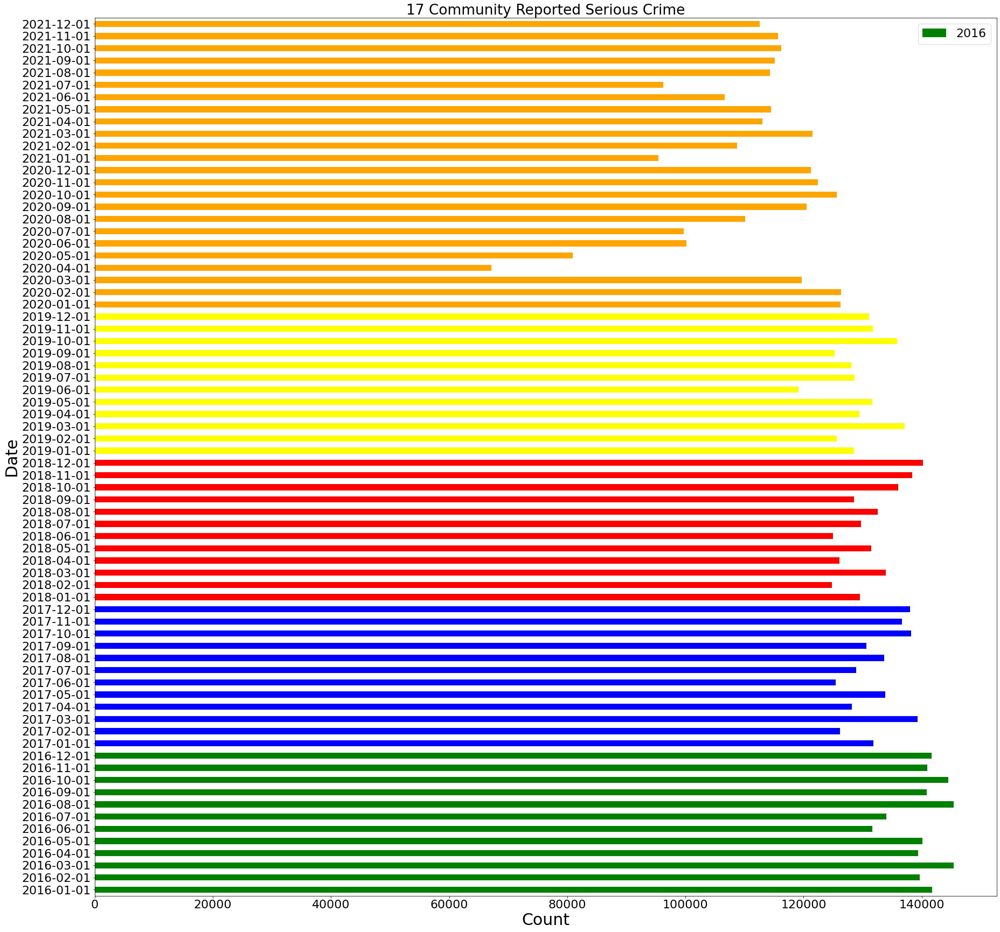

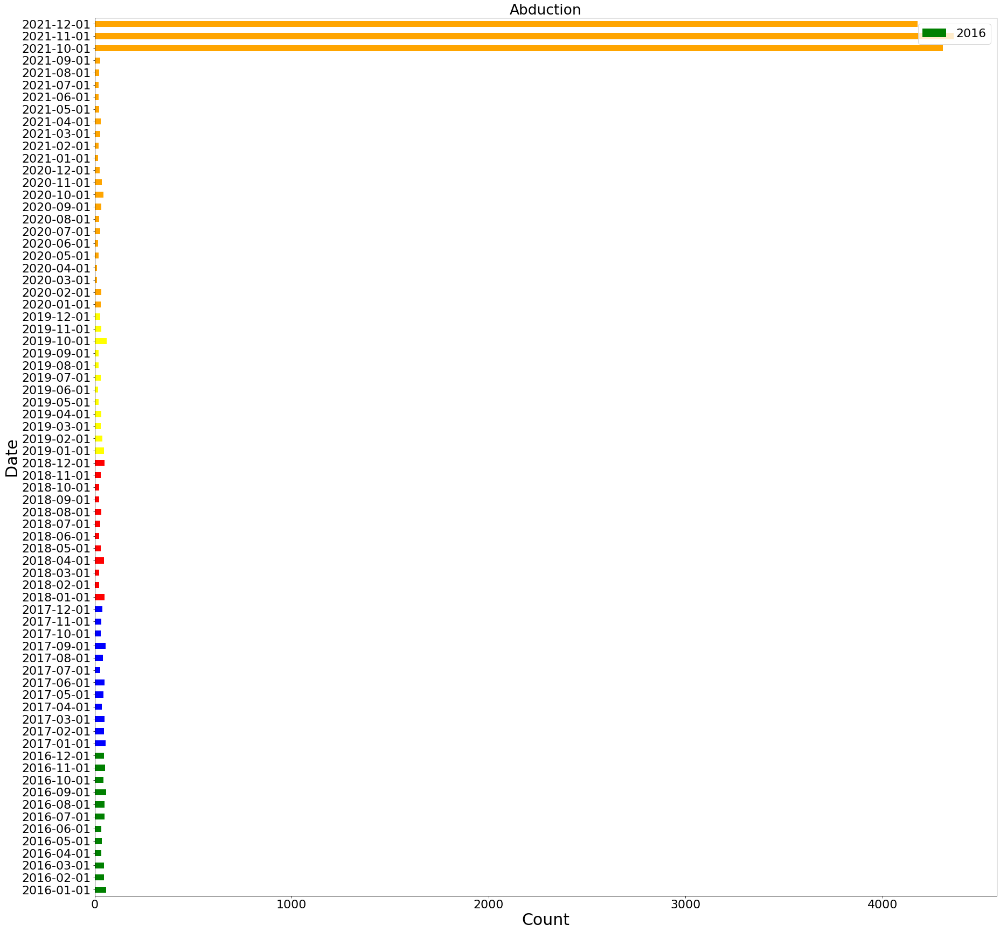

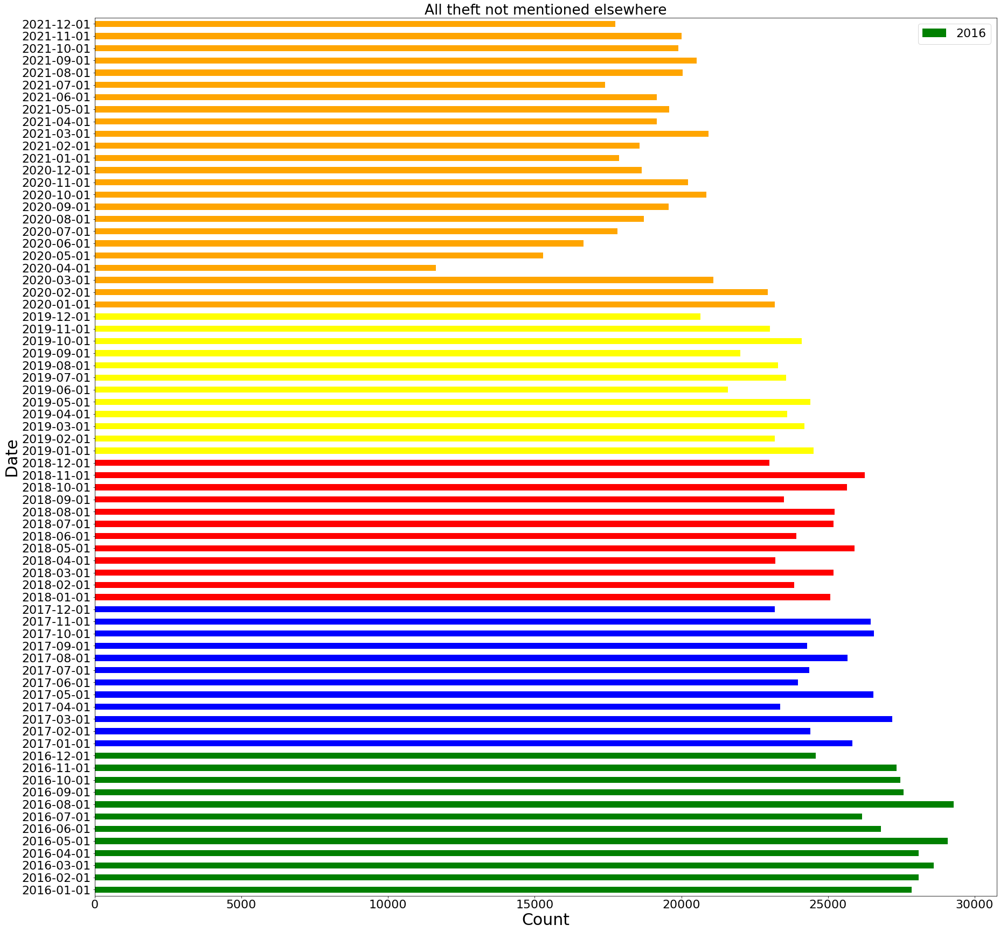

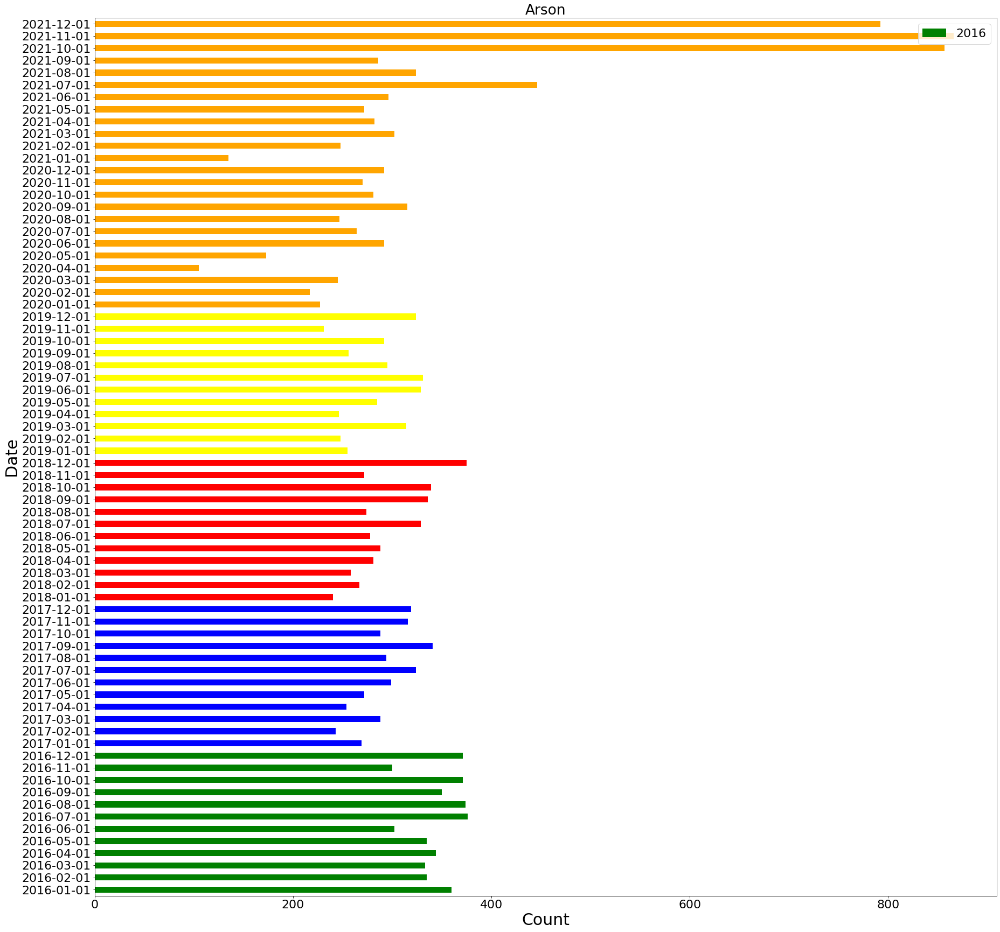

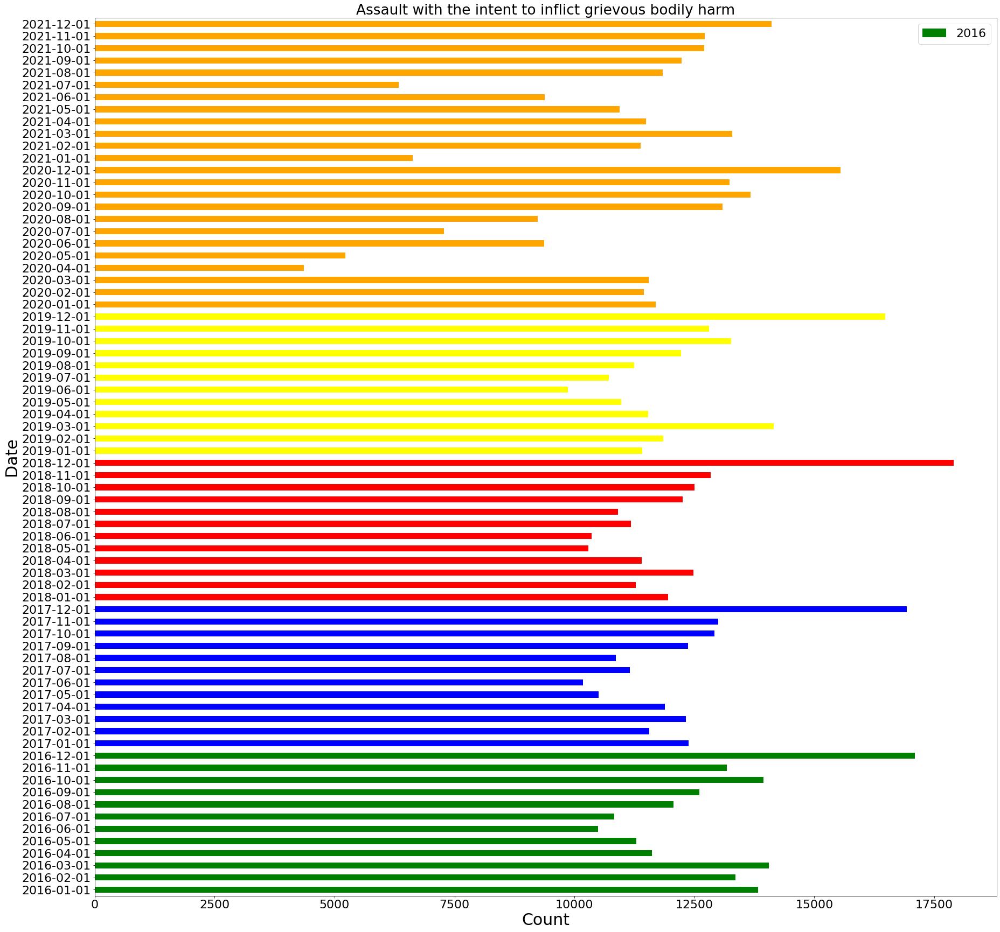

...

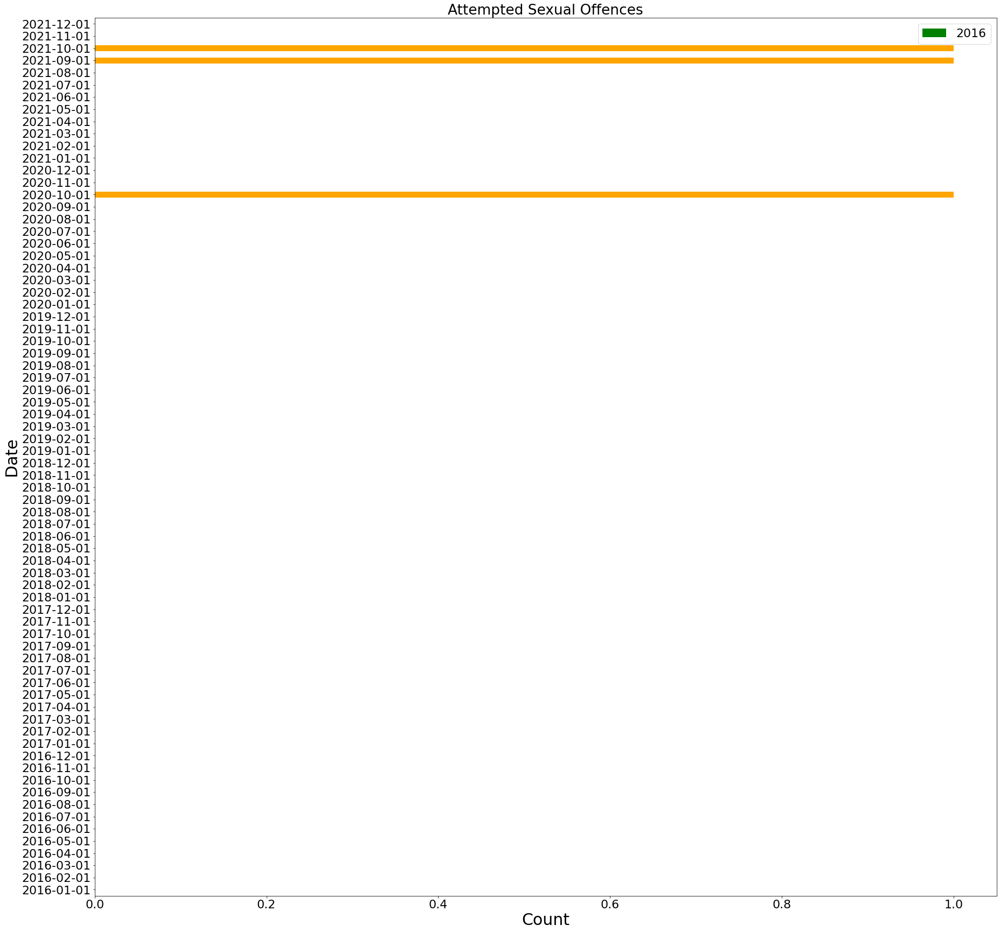

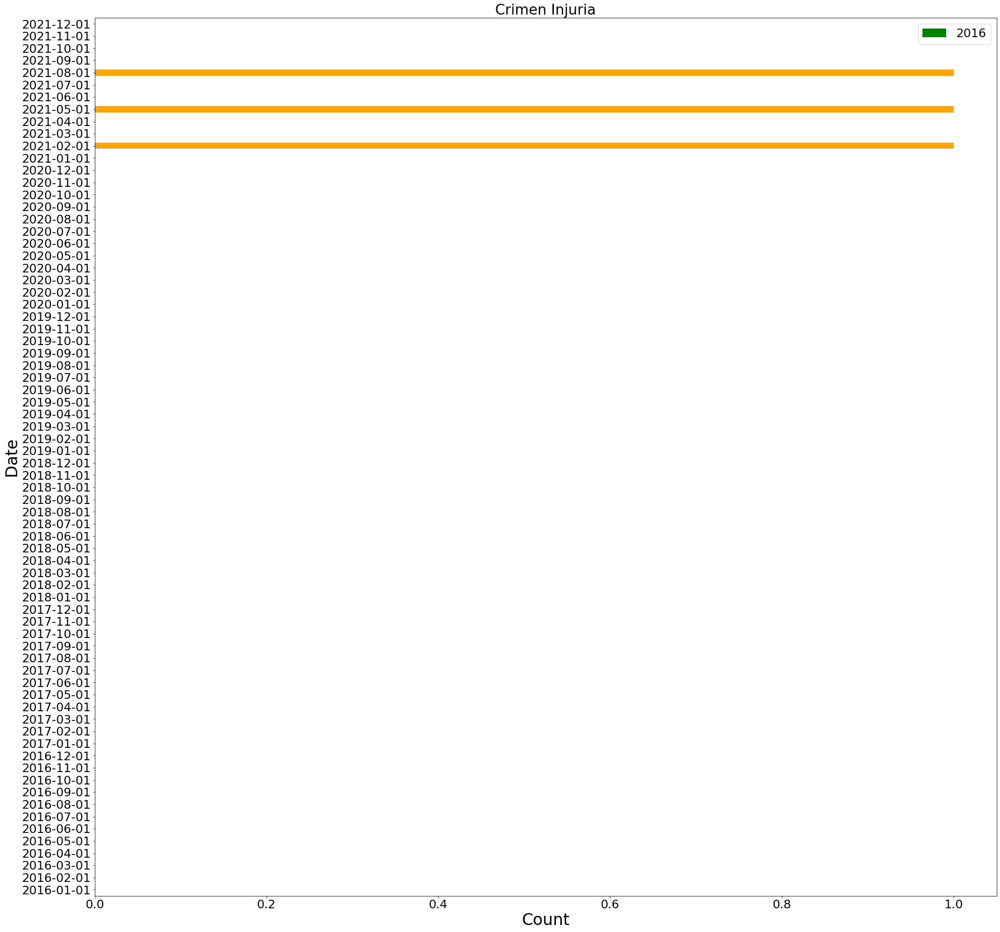

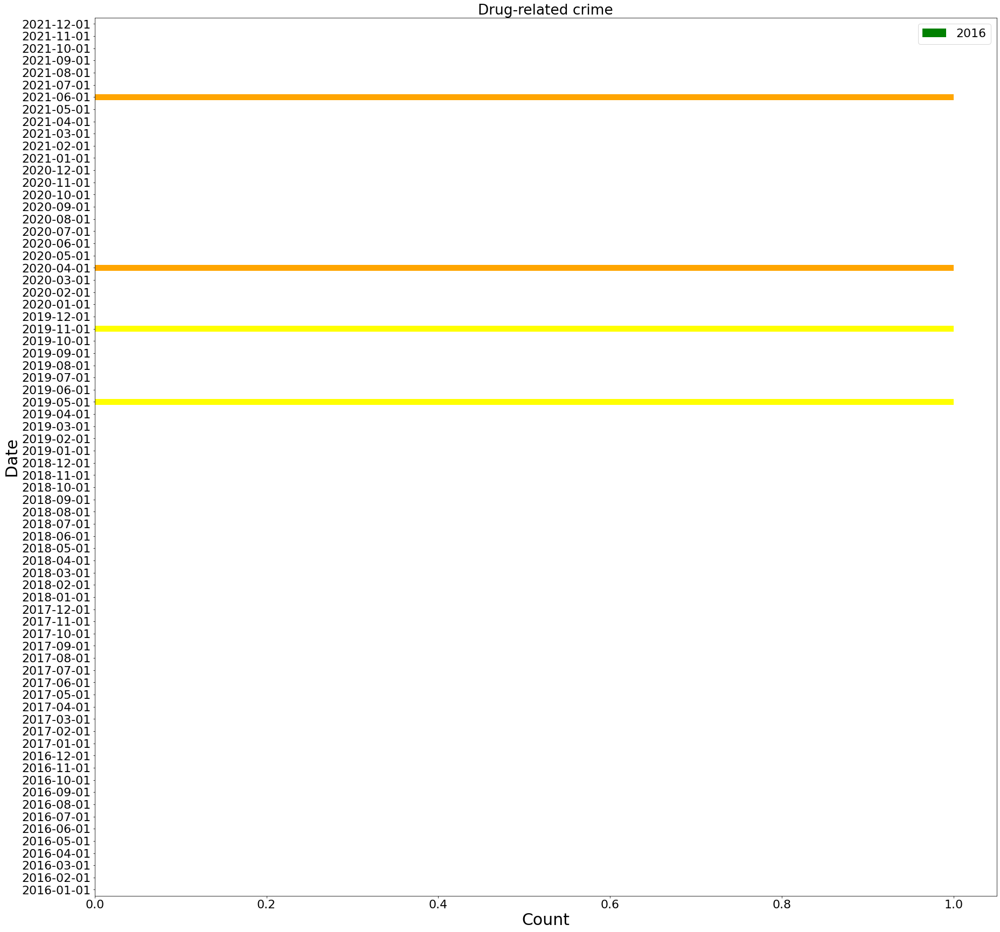

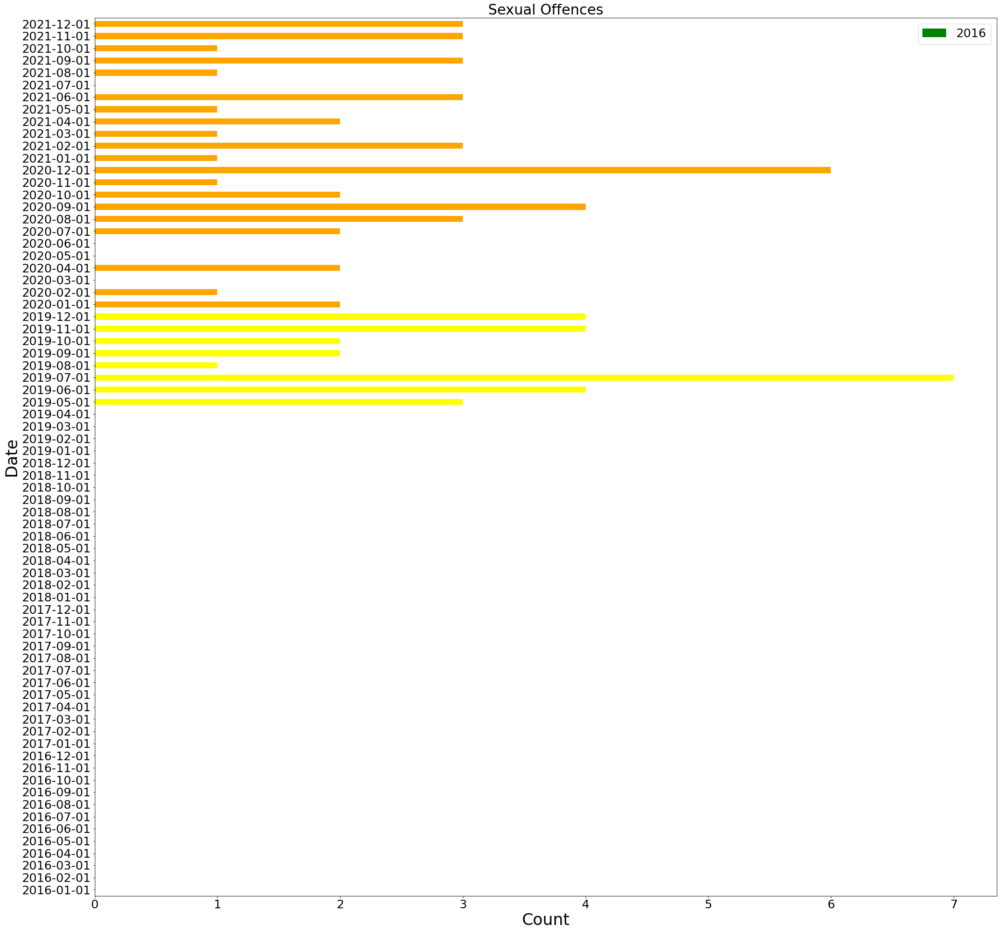

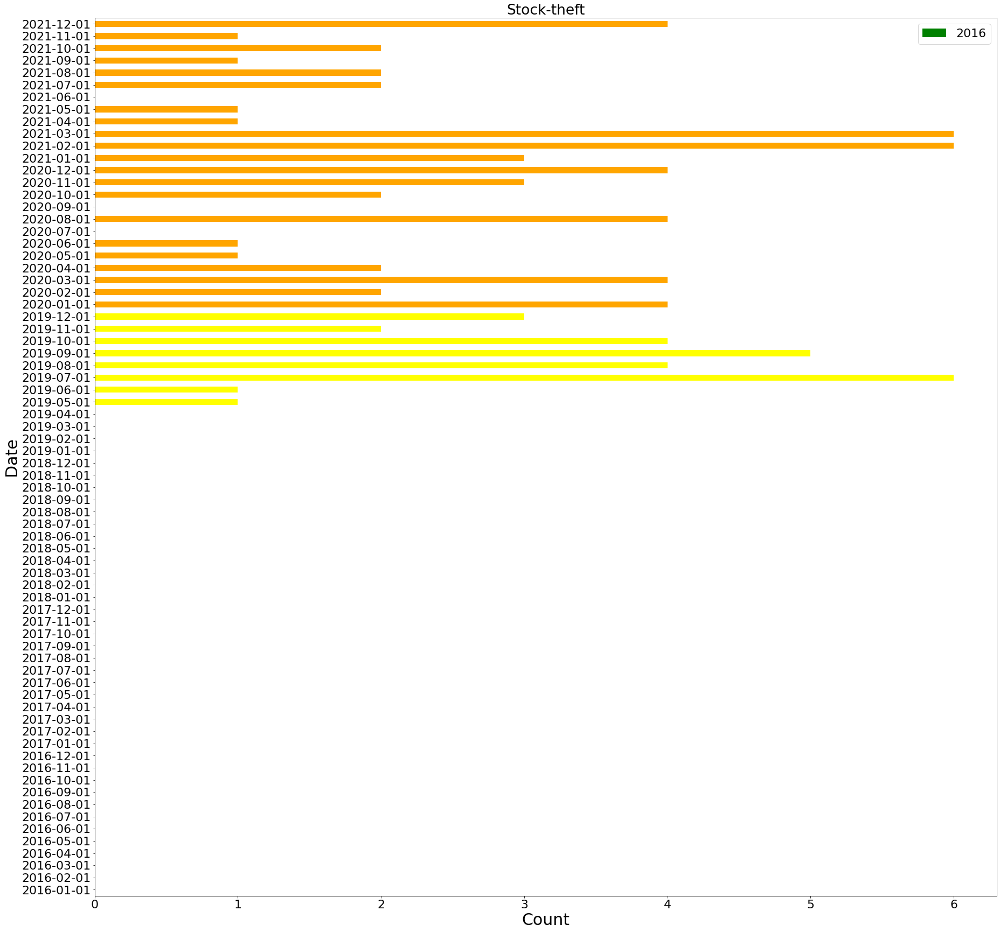

In [ ]:
for k in df['crime_category'].unique():
    
    df_filtered = df[df['crime_category'] == k]
    
    df_grouped = pd.DataFrame(df_filtered.groupby(by="date", as_index = False)["number_of_crimes"].sum())

    df_grouped = df_grouped.sort_values(by = 'date')
    

    colors = []
    label = []

    for i in df_grouped.iloc[:,0]:
        if '16' in str(i):
            colors.append('green')
            label.append(2016)
        elif '17' in str(i):
            colors.append('blue')
            label.append(2017)
        elif '18' in str(i):
            colors.append('red')
            label.append(2018)
        elif '19' in str(i):
            colors.append('yellow')
            label.append(2019)
        elif '20' in str(i):
            colors.append('orange')
            label.append(2020)
        elif '21' in str(i):
            colors.append('purple')
            label.append(2021)

    #print(colors)

    plt.rcParams.update({'font.size': 22}) # must set in top
    df_grouped.plot.barh(x='date', y='number_of_crimes',
                 title=k, color=colors, figsize=(30, 30))

    #plt.legend(loc="upper right")

    plt.xlabel('Count', fontsize = 30)
    plt.ylabel('Date', fontsize = 30)
    plt.legend(['2016', '2020', '2019', '2018', '2017', '2016','2021'], loc='upper right')
    plt.show()

**Crime Selected - Arson**
Separate model will be created for different crime. 

In [60]:
df_filtered = df[df['crime_category'] == 'Arson']
df_filtered.head()

,station,province,district,crime_category,date,number_of_crimes,Latitude,Longitude,temperature_2m_min (°C)_mean,apparent_temperature_max (°C)_mean,...,temperature_2m_max (°C)_std,temperature_2m_min (°C)_std,apparent_temperature_max (°C)_std,apparent_temperature_min (°C)_std,shortwave_radiation_sum (MJ/m²)_std,rain_sum (mm)_std,precipitation_hours (h)_std,windspeed_10m_max (km/h)_std,windgusts_10m_max (km/h)_std,winddirection_10m_dominant (°)_std
3,east london,Eastern Cape,East London Cc,Arson,2016-01-01,0,-33.011051,27.910049,12.219355,26.070968,...,3.842171,1.799892,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127
47,cambridge,Eastern Cape,Mdantsane Cc,Arson,2016-01-01,0,-32.978457,27.887341,12.219355,26.070968,...,3.842171,1.799892,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127
91,mount road,Eastern Cape,Mount Road Cc,Arson,2016-01-01,0,-33.946889,25.590808,12.219355,26.070968,...,3.842171,1.799892,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127
135,humewood,Eastern Cape,Mount Road Cc,Arson,2016-01-01,0,-33.977675,25.641190,12.219355,26.070968,...,3.842171,1.799892,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127
179,king william's town,Eastern Cape,King William'S T Cc,Arson,2016-01-01,0,-32.880310,27.394544,12.219355,26.070968,...,3.842171,1.799892,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127


In [61]:
df_filtered.iloc[0,7]

27.910049

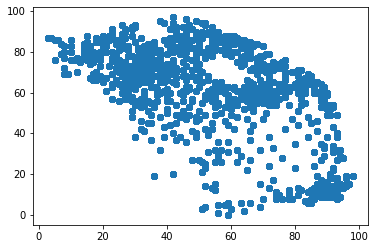

In [81]:
GRID_SIZE = 100
PERIOD = 3


SOUTH_AFRICA_LATITUDE_1 = -22
SOUTH_AFRICA_LATITUDE_2 = -35
SOUTH_AFRICA_LONGITUDE_1 = 17
SOUTH_AFRICA_LONGITUDE_2 = 33

# Each grid box represents how many latitude and longitude

grid_lat = abs(SOUTH_AFRICA_LATITUDE_2 - SOUTH_AFRICA_LATITUDE_1)/GRID_SIZE
grid_long = abs(SOUTH_AFRICA_LONGITUDE_2 - SOUTH_AFRICA_LONGITUDE_1)/GRID_SIZE

# Transform geographical latitude and longitude into grid coordinates

X = []
Y = []

XY = []

for i in range(len(df_filtered)):
    X.append(round(abs(df_filtered['Latitude'].iloc[i] - SOUTH_AFRICA_LATITUDE_1)/grid_lat))
    Y.append(round(abs(df_filtered['Longitude'].iloc[i] - SOUTH_AFRICA_LONGITUDE_1)/grid_long))
    XY.append((X[i],Y[i]))
    
df_filtered['grid_lat'] = X
df_filtered['grid_long'] = Y
    
    
plt.scatter(X, Y)
plt.show()

Above graph plots all the points in South Africa that are prone to Arson. Rest of the coordinates are not considered for this case.**Grid Size** is a hyperparameter and can be modified to see the variation in the result. Specifically, increased grid segmentation will result in increased unbalance, which can lead to the algorithm using the overall learning trend to only predict nonoccurring crimes.

# Feature Engineering

In terms of structural features, we simultaneously consider time and spatial factors, splitting features into two types


*   We calculate the accumulated instances of crimes in certain time periods, reflecting the uneven distribution of crime. Broken Windows theory suggests that areas with higher population density or increased presence of gangs or parolees may be correlated with increased crime rates. A current high incidence of crime in an area suggests an increased probability of crime in that area in the near future. 

*   Calculating number of crimes committed at the same time in the previous year considers that crimes occur in specific time frames. For example, summer school holidays release large numbers of young people from the constraints of daily school activity, increasing opportunities to form gangs and engage in crime. This design complements the lack of time periodicity considerations in the first feature design.


We account for the time and space factors of neighboring grids and make use of the neighborhood characteristics to make predictions. In other words, given the diffuse nature of crime, there is a high likelihood that police activity in one crime-ridden area will push criminals into neighboring areas.


Here we use each month as the basic time unit. The features for all grid points are extracted for the month and are treated as one feature vector. Similarly, features for the rest of the months over the whole time horizon is generated, to create a set of feature vectors, which will be used to train our model. The feature vector we will generate for each month is displayed below. 

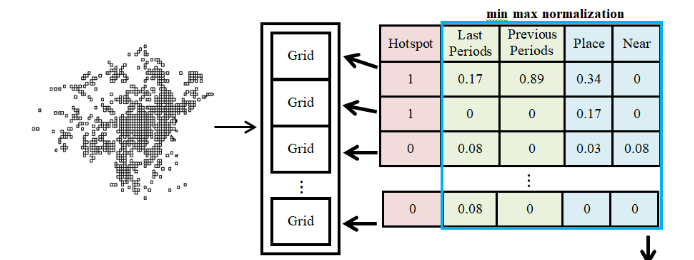


**Feature Definitions**



1.   Hotspot - Calculate number of crimes for each month in the grid
2.   Last periods - Cummulative number of crimes in the past 1,3,,6,9,11 months
3.   Previous periods - Number of crimes in the last year
4.   Near - Each last period and previous period crime calculation near the grid
5.   All the weather data


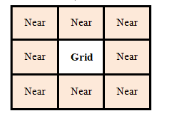

Here is how **Near** feature is calculated

In [82]:
df_filtered.head()

    

,station,province,district,crime_category,date,number_of_crimes,Latitude,Longitude,temperature_2m_min (°C)_mean,apparent_temperature_max (°C)_mean,...,apparent_temperature_max (°C)_std,apparent_temperature_min (°C)_std,shortwave_radiation_sum (MJ/m²)_std,rain_sum (mm)_std,precipitation_hours (h)_std,windspeed_10m_max (km/h)_std,windgusts_10m_max (km/h)_std,winddirection_10m_dominant (°)_std,grid_lat,grid_long
3,east london,Eastern Cape,East London Cc,Arson,2016-01-01,0,-33.011051,27.910049,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,85,68
47,cambridge,Eastern Cape,Mdantsane Cc,Arson,2016-01-01,0,-32.978457,27.887341,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,84,68
91,mount road,Eastern Cape,Mount Road Cc,Arson,2016-01-01,0,-33.946889,25.590808,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,92,54
135,humewood,Eastern Cape,Mount Road Cc,Arson,2016-01-01,0,-33.977675,25.641190,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,92,54
179,king william's town,Eastern Cape,King William'S T Cc,Arson,2016-01-01,0,-32.880310,27.394544,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,84,65


In [74]:
n_active_grid_points = len(list(set(XY)))
active_grid_points = list(set(XY))
n_months = 12*6

#date = datetime.date(2016, 1, 1)
#df_filtered[df_filtered['date'] == date]
print(df_filtered.columns)

Index(['station', 'province', 'district', 'crime_category', 'date',
       'number_of_crimes', 'Latitude', 'Longitude',
       'temperature_2m_min (°C)_mean', 'apparent_temperature_max (°C)_mean',
       'apparent_temperature_min (°C)_mean',
       'shortwave_radiation_sum (MJ/m²)_mean', 'rain_sum (mm)_mean',
       'precipitation_hours (h)_mean', 'windspeed_10m_max (km/h)_mean',
       'windgusts_10m_max (km/h)_mean', 'winddirection_10m_dominant (°)_mean',
       'temperature_2m_max (°C)_mean', 'temperature_2m_max (°C)_std',
       'temperature_2m_min (°C)_std', 'apparent_temperature_max (°C)_std',
       'apparent_temperature_min (°C)_std',
       'shortwave_radiation_sum (MJ/m²)_std', 'rain_sum (mm)_std',
       'precipitation_hours (h)_std', 'windspeed_10m_max (km/h)_std',
       'windgusts_10m_max (km/h)_std', 'winddirection_10m_dominant (°)_std',
       'grid_lat', 'grid_long'],
      dtype='object')


In [ ]:
def diff_month(d1, d2):
    return (d1.year - d2.year) * 12 + d1.month - d2.month

def hotspot(lat,lon,date):
    
    df_shortlisted = df_filtered[df_filtered['grid_lat'] == lat ]
    df_shortlisted = df_shortlisted[df_shortlisted['grid_long'] == lon ]
    df_shortlisted = df_shortlisted[df_shortlisted['date'] == date ]
    

    if df_shortlisted.empty:
        return 0, 0

    
    return df_shortlisted['number_of_crimes'].iloc[0] , 1


def last_period(lat,lon,date):

    df_shortlisted = df_filtered[df_filtered['grid_lat'] == lat ]
    df_shortlisted = df_shortlisted[df_shortlisted['grid_long'] == lon ]

    df_shortlisted.sort_values(by='date')

    count_1 = 0
    count_3 = 0
    count_6 = 0
    count_9 = 0
    count_11 = 0

    for i in range(len(df_shortlisted)):

        difference = diff_month(date, df_shortlisted['date'].iloc[i])
        crimes = df_shortlisted['number_of_crimes'].iloc[i]

        if difference >= 12:
            break

        elif difference < 0:
            break

        elif difference < 1:
            continue

        elif difference == 1:
            count_1 += crimes
            count_3 += crimes
            count_6 += crimes
            count_9 += crimes
            count_11 += crimes

        elif difference <= 3:
            count_3 += crimes
            count_6 += crimes
            count_9 += crimes
            count_11 += crimes

        elif difference <= 6:
            
            count_6 += crimes
            count_9 += crimes
            count_11 += crimes


        elif difference <= 9:
            
            count_9 += crimes
            count_11 += crimes

        elif difference <= 11:
            
            count_11 += crimes

        
    return count_1,count_3,count_6,count_9,count_11


def previous_period(lat,lon,date):

    df_shortlisted = df_filtered[df_filtered['grid_lat'] == lat ]
    df_shortlisted = df_shortlisted[df_shortlisted['grid_long'] == lon ]

    df_shortlisted.sort_values(by='date')

    count = 0

    for i in range(len(df_shortlisted)):

        difference = diff_month(date, df_shortlisted['date'].iloc[i])
        crimes = df_shortlisted['number_of_crimes'].iloc[i]

        if difference < 0:
            break

        elif difference < 12:
            continue

        elif difference >= 24:
            break

        else:
            count += crimes

    return count



def near_last_period(lat,lon,date):


    top_1 , bottom_1 , right_1, left_1 = 0, 0, 0, 0
    top_right_1, top_left_1 = 0, 0
    bottom_right_1, bottom_left_1 = 0, 0

    top_3 , bottom_3 , right_3, left_3 = 0, 0, 0, 0
    top_right_3, top_left_3 = 0, 0
    bottom_right_3, bottom_left_3 = 0, 0

    top_6 , bottom_6 , right_6, left_6 = 0, 0, 0, 0
    top_right_6, top_left_6 = 0, 0
    bottom_right_6, bottom_left_6 = 0, 0

    top_9 , bottom_9 , right_9, left_9 = 0, 0, 0, 0
    top_right_9, top_left_9 = 0, 0
    bottom_right_9, bottom_left_9 = 0, 0

    top_11 , bottom_11 , right_11, left_11 = 0, 0, 0, 0
    top_right_11, top_left_11 = 0, 0
    bottom_right_11, bottom_left_11 = 0, 0

    


    

    df_shortlisted = df_filtered[df_filtered['grid_lat'] == lat ]
    df_shortlisted = df_shortlisted[df_shortlisted['grid_long'] == lon ]

    df_shortlisted.sort_values(by='date')





In [75]:
final_columns = ['Grid_x','Grid_y','Month','Year',
       'temperature_2m_min (°C)_mean', 'apparent_temperature_max (°C)_mean',
       'apparent_temperature_min (°C)_mean',
       'shortwave_radiation_sum (MJ/m²)_mean', 'rain_sum (mm)_mean',
       'precipitation_hours (h)_mean', 'windspeed_10m_max (km/h)_mean',
       'windgusts_10m_max (km/h)_mean', 'winddirection_10m_dominant (°)_mean',
       'temperature_2m_max (°C)_mean', 'temperature_2m_max (°C)_std',
       'temperature_2m_min (°C)_std', 'apparent_temperature_max (°C)_std',
       'apparent_temperature_min (°C)_std',
       'shortwave_radiation_sum (MJ/m²)_std', 'rain_sum (mm)_std',
       'precipitation_hours (h)_std', 'windspeed_10m_max (km/h)_std',
       'windgusts_10m_max (km/h)_std', 'winddirection_10m_dominant (°)_std', 
       'Hotspot','Last_Periods_1','Last_Periods_3','Last_Periods_6','Last_Periods_9',
       'Last_Periods_11','Previous_Period', 'Near_Last_Periods_1','Near_Last_Periods_3','Near_Last_Periods_6',
       'Near_Last Periods_9', 'Near_Last Periods_11','Near_Previous_Period','Crime']

final_dataframe = pd.DataFrame(columns = final_columns)

for y in tqdm(range(2016,2022)):
    for m in tqdm(range(1,13)): 
        for i in active_grid_points:
            df_col = {'Grid_x': i[0], 'Grid_y': i[1], 'Month':m, 'Year': y}
            

            final_dataframe = final_dataframe.append({'Grid_x': i[0], 'Grid_y': i[1], 'Month':m, 'Year': y}, ignore_index=True)

final_dataframe.head()

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
final_dataframe['Month'] = final_dataframe['Month'].astype(int)
final_dataframe['Year'] = final_dataframe['Year'].astype(int)
final_dataframe['Grid_x'] = final_dataframe['Grid_x'].astype(int)
final_dataframe['Grid_y'] = final_dataframe['Grid_y'].astype(int)

final_dataframe.head()

In [ ]:
for i in tqdm(range(len(final_dataframe))):

    grid_x , grid_y = final_dataframe.iloc[i,0], final_dataframe.iloc[i,1]
    month , year = final_dataframe.iloc[i,2], final_dataframe.iloc[i,3]

    date = datetime.date(year, month, 1)

    


    final_dataframe['Hotspot'].iloc[i] , final_dataframe['Crime'].iloc[i]  = hotspot(grid_x, grid_y, date)

    final_dataframe['Last_Periods_1'].iloc[i] , final_dataframe['Last_Periods_3'].iloc[i], final_dataframe['Last_Periods__6'].iloc[i] , final_dataframe['Last_Periods_9'].iloc[i] , final_dataframe['Last_Periods_11'].iloc[i] = last_period(grid_x,grid_y, date)

    final_dataframe['Previous_Period'].iloc[i] = previous_period(grid_x, grid_y , date)






In [77]:
df_filtered['district'].iloc[1]

'Mdantsane Cc'

In [78]:
df_filtered.head(2)

,station,province,district,crime_category,date,number_of_crimes,Latitude,Longitude,temperature_2m_min (°C)_mean,apparent_temperature_max (°C)_mean,...,apparent_temperature_max (°C)_std,apparent_temperature_min (°C)_std,shortwave_radiation_sum (MJ/m²)_std,rain_sum (mm)_std,precipitation_hours (h)_std,windspeed_10m_max (km/h)_std,windgusts_10m_max (km/h)_std,winddirection_10m_dominant (°)_std,grid_lat,grid_long
3,east london,Eastern Cape,East London Cc,Arson,2016-01-01,0,-33.011051,27.910049,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,215,76
47,cambridge,Eastern Cape,Mdantsane Cc,Arson,2016-01-01,0,-32.978457,27.887341,12.219355,26.070968,...,3.858514,2.208293,4.517565,11.463934,4.712372,3.588659,7.162014,68.588127,215,76
